In [1]:
!pip install -U git+https://github.com/aguirrejuan/ConvRFF.git@2d8b48f9f3825192585430fa3285b675d263e560 --quiet

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 50.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.5/199.5 kB 18.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.6 MB/s eta 0:00:00


In [2]:
import wandb
import numpy as np 
import os 
from glob import glob
import tensorflow as tf 
from tqdm import tqdm 
import matplotlib.pyplot as plt 
import pandas as pd 

In [7]:
from google.colab import drive
drive.mount('/content/drive')

WANDB_PROJECT = 'thesis_experiments'
ROOT_FOLDER = '/content/drive/MyDrive/Pruebas_Tesis/cam_data_refactor_database'
api = wandb.Api()
runs = api.runs(WANDB_PROJECT)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [4]:
model2name = {'u_b':'U-Net',
              'u_b_s':'U-Net S-M1',
              'u_r_s':'U-Net CRFFg S-M3',
              'r_b':'ResUNet',
              'f_b':'FCN',
              'u_r_s_m1':'U-Net CRFFg S-M1',
              'u_b_s_m3':'U-Net S-M3',
              'f_r_s_m1': 'FCN CRFFg S-M1',
              'r_r_s_m1':'ResUNet CRFFg S-M1',
              'r_r_s':'ResUNet CRFFg S-M3',
              'r_b_s':'ResUNet S-M1',
              'f_r_s': 'FCN CRFFg S-M3',
              'f_b_s': 'FCN S-M1',
              'r_b_s_m3': 'ResUNet S-M3', 
              'f_b_s_m3': 'FCN S-M3',
           #'u_r_b' :  'Unet RFF Backbone'
           }

def get_path(dataset, id_run):
    name_file = f'colab11_thesis_experiments_{id_run}_*/{dataset}_layercam.mimic_memmap'
    file_path = os.path.join(ROOT_FOLDER, name_file)
    file_path = glob(file_path)
    if len(file_path) ==0:
        return None 
    return file_path[0] 


def process_df(df, max_norm=True):
    df = df.copy()
    colums_dice = [c for c in df.columns if 'dice' in c]
    df[colums_dice] = -df[colums_dice]
    df['layer'] = df['layer'].apply(lambda x: '_'.join(re.findall(r'\d+', x))).copy()
    if max_norm:
        columns_w = [c for c in df.columns if 'w_' in c]
        array = np.array(df[columns_w])
        array = array/(array.max(axis=1, keepdims=True) + 1e-16)
        df[columns_w] = array
    return df 

def load_csv(id_run, dataset):
    file_path = get_path(dataset, id_run)
    df_name = os.path.dirname(file_path)
    df_name = os.path.join(df_name,f'{dataset}.csv')
    return pd.read_csv(df_name)


def load_csv_interpretability(ids, dataset):
    df = pd.concat([load_csv(id_run, dataset) for id_run in ids])
    df['layer'] = df['layer'].apply(lambda x: x if 'Act' not in x else x+'0')
    df['layer'] = df['layer'].apply(lambda x: x if 'Pool' not in x else x+'0')
    df = process_df(df)
    df['model'] = df['model'].apply(lambda x: model2name[x])
    df = df[ (((df['layer'] == '01' ) | (df['layer'] == '02') | (df['layer'] == '03') | (df['layer'] == '04')) & (df['model'] != 'FCN')) |
        (((df['layer'] == '300' ) | (df['layer'] == '400')) & (df['model'] == 'FCN')) |
        (((df['layer'] == '11' ) | (df['layer'] == '21') | (df['layer'] == '31' ) | (df['layer'] == '41')) & (df['model'] == 'U-Net')) |
        (((df['layer'] == '01_010' ) | (df['layer'] == '03_010') | (df['layer'] == '05_010' ) | (df['layer'] == '07_010')) & (df['model'] == 'ResUNet'))
        ]

    df = df.groupby(by=['model']).mean().reset_index()
    return df 


In [6]:
import re
import matplotlib

from matplotlib.gridspec import GridSpec
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

font = {#'family' : 'normal',
        #'weight' : 'bold',
        'size'   : 10}
params = {'legend.fontsize': 12,
          'legend.handlelength': 2}
matplotlib.rcParams.update(params)

matplotlib.rc('font', **font)

import seaborn as sns 
sns.set_theme()


import matplotlib.pyplot as plt
import seaborn as sns 
from matplotlib import cm

from matplotlib.ticker import FormatStrFormatter


markers=["o", "P", "X","d","p"]

models_markers = {'FCN':markers[0],
                  'FCN CRFFg S-M1':markers[1],
                  'FCN CRFFg S-M3':markers[2],
                  'FCN S-M1':markers[3],
                  'FCN S-M3':markers[4],
                  'ResUNet':markers[0],
                  'ResUNet CRFFg S-M1':markers[1],
                  'ResUNet CRFFg S-M3':markers[2],
                  'ResUNet S-M1':markers[3],
                  'ResUNet S-M3':markers[4],
                  'U-Net':markers[0],
                  'U-Net CRFFg S-M1':markers[1],
                  'U-Net CRFFg S-M3':markers[2],
                  'U-Net S-M1':markers[3],
                  'U-Net S-M3':markers[4]
                  }


def map_metric2name(metric_name,mapCh2Name = {'p':'\\rho',
                                                  'w':'\\Psi',
                                                  'dice':'Dice',
                                              '0':'',
                                              '1':''}):
    m_s = metric_name.split('_')
    if mapCh2Name['0'] == '':
        return f"${mapCh2Name[m_s[0]]}$"

    metric_name = '_'.join([mapCh2Name[cha] for cha in m_s])

    return f"${metric_name}$"


models_pallete_high_brightness = np.concatenate([  
                                    cm.get_cmap('Blues', 128)(np.ones((5,))*0.7),#(np.linspace(0.3, 0.9, 5)),
                                    cm.get_cmap('Reds', 128)(np.ones((5,))*0.7),#(np.linspace(0.3, 0.9, 5)),
                                    cm.get_cmap('Greens', 128)(np.ones((5,))*0.7)#(np.linspace(0.3, 0.9, 5)),

                                ])

models_pallete_low_brightness = np.concatenate([
                                    cm.get_cmap('Blues', 128)(np.ones((5,))*0.4),#(np.linspace(0.3, 0.9, 5)),
                                    cm.get_cmap('Reds', 128)(np.ones((5,))*0.4),#(np.linspace(0.3, 0.9, 5)),
                                    cm.get_cmap('Greens', 128)(np.ones((5,))*0.4)#(np.linspace(0.3, 0.9, 5)),
                                ])


def order_models(x):

    ints = re.findall(r'\d+', x)
    if len(ints):
        return int(ints[0])

    else:
        return 0 




def plot_metrics(dfs, metrics_tuples, dataset, mapCh2Name = {'p':'\\rho',
                                                  'w':'\\Psi',
                                                  'dice':'Dice',
                                              '0':'',
                                              '1':''}):
    if type(dfs)!= list:
        dfs = [dfs]
        

    dfs = [df.copy() for df in dfs]


    fig, axs = plt.subplots(1,3, figsize=(15,4))
    for i,metrics_tuple in enumerate(metrics_tuples):
        for j,df in enumerate(dfs): 
            models_pallete = models_pallete_high_brightness  if j==0 else  models_pallete_low_brightness

            print(len(df))
            sns.scatterplot(data=df, x=metrics_tuple[0], y=metrics_tuple[1], hue='model', ax=axs[i],
                            hue_order = sorted(df['model']), palette=models_pallete, s=100,
                            style="model", markers=models_markers, legend=True if j==0 else False)
            
            # if j==len(dfs):
            #     continue
            axs[i].xaxis.set_major_formatter(FormatStrFormatter('%.3f'))
            axs[i].set_ylabel(map_metric2name(metrics_tuple[1],mapCh2Name))
            axs[i].set_xlabel(map_metric2name(metrics_tuple[0],mapCh2Name))
            # axs[i].set_ylim([0.84,0.97])
            # axs[i].set_xlim([0.87,1])
            axs[i].set_ylim([0,1])
            axs[i].set_xlim([0,1])
        for ax in axs[1::]:
            try:
                ax.legend_.remove()
            except:
                pass

        sns.move_legend(axs[0],
            loc="lower center",
            #bbox_to_anchor=bbox_to_anchor,
            bbox_to_anchor=(1.6, 1.05),
            ncol=3,
            title=None,
            frameon=False,
            markerscale=1.2
        )
        plt.subplots_adjust(
                        wspace=0.3,
                        hspace=0.1)
        

    plt.savefig(f'results_{dataset}.pdf',bbox_inches='tight', pad_inches=0)
    plt.show()
    

<ipython-input-6-5b2a45d01592>:62: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm.get_cmap('Blues', 128)(np.ones((5,))*0.7),#(np.linspace(0.3, 0.9, 5)),
<ipython-input-6-5b2a45d01592>:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm.get_cmap('Reds', 128)(np.ones((5,))*0.7),#(np.linspace(0.3, 0.9, 5)),
<ipython-input-6-5b2a45d01592>:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm.get_cmap('Greens', 128)(np.ones((5,))*0.7)#(np.linspace(0.3, 0.9, 5)),
<ipython-input-6-

In [8]:
ids1 = [run.id for run in runs if  run.state=='finished' and run.config['dataset'] == 'infrared_thermal_feet' and run.sweep.id == '6l60ok26' and run.config['model'] != 'u_r_b']
ids2 = [run.id for run in runs if  run.state=='finished' and run.config['dataset'] == 'infrared_thermal_feet_nodataaug' and run.sweep.id == 'hg11kida' and run.config['model'] != 'u_r_b']

df1 = load_csv_interpretability(ids1, 'infrared_thermal_feet')
df2 = load_csv_interpretability(ids2, 'infrared_thermal_feet')

<ipython-input-4-23abce0814ee>:59: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(by=['model']).mean().reset_index()
<ipython-input-4-23abce0814ee>:59: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df = df.groupby(by=['model']).mean().reset_index()


/usr/local/lib/python3.9/dist-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


15
15


/usr/local/lib/python3.9/dist-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/usr/local/lib/python3.9/dist-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/usr/local/lib/python3.9/dist-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


15
15
15


/usr/local/lib/python3.9/dist-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:
/usr/local/lib/python3.9/dist-packages/seaborn/_oldcore.py:200: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if palette in QUAL_PALETTES:


15


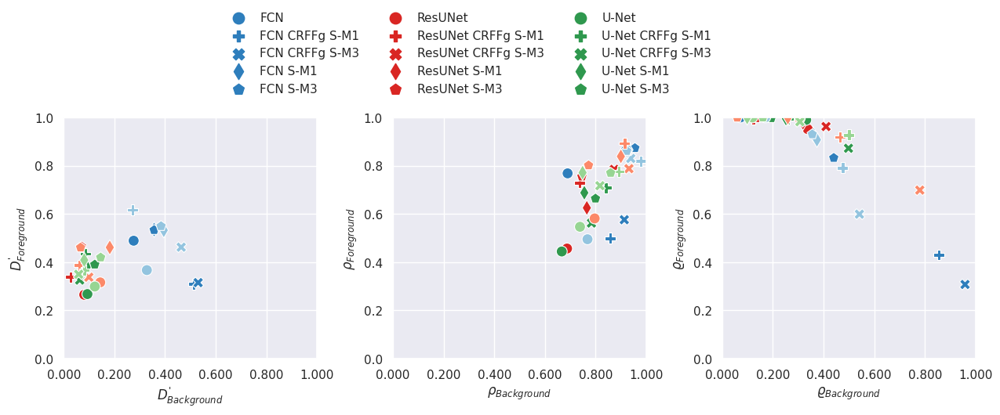

In [9]:
metrics_tuples = [('dice_0', 'dice_1'), ('p_0', 'p_1'),	('w_0',	'w_1')]

mapCh2Name = {'p':'\\rho',
            'w':'\\varrho',
            'dice':"D^'",
             '1':'{Foreground}',
             '0':'{Background}'}


plot_metrics([df2,df1], metrics_tuples, 'infrared', mapCh2Name)

In [29]:
from gcpds.image_segmentation.datasets.segmentation import InfraredThermalFeet
from convRFF.class_activation_maps.cam_data import mimic_mmap
from mpl_toolkits.axes_grid1 import make_axes_locatable

def get_id(dataset, model):
    if dataset=='infrared_thermal_feet':
        return [run.id for run in runs if  run.state=='finished' and run.config['dataset'] == 'infrared_thermal_feet' and run.sweep.id == '6l60ok26' and  run.config['model'] == model][0]

    if dataset=='infrared_thermal_feet_nodataaug':
        return [run.id for run in runs if  run.state=='finished' and run.config['dataset'] == 'infrared_thermal_feet_nodataaug' and run.sweep.id == 'hg11kida' and  run.config['model'] == model][0]

def get_dataset(name_dataset):
    if 'test' in name_dataset:
        name_dataset = '_'.join(name_dataset.split('_')[1::])
    datasets = {
                'infrared_thermal_feet':InfraredThermalFeet(split=[0.1,0.1],seed=42),
                'infrared_thermal_feet_nodataaug':InfraredThermalFeet(split=[0.1,0.1],seed=42)}
    return datasets[name_dataset]

def get_path(dataset, id_run):
    
    name_file = f'colab11_thesis_experiments_{id_run}_*/{dataset}_layercam.mimic_memmap'
    file_path = os.path.join(ROOT_FOLDER, name_file)
    file_path = glob(file_path)
    if len(file_path) ==0:
        return None 
    return file_path[0] 

def load_csv(id_run, dataset):
    file_path = get_path(dataset, id_run)
    df_name = os.path.dirname(file_path)
    df_name = os.path.join(df_name,f'{dataset}.csv')
    return pd.read_csv(df_name)

def get_weight(id, dataset, layers):
    df = load_csv(id, dataset)
    df = df.query('layer in @layers')
    df_ = df.groupby(by=['model','layer']).mean().reset_index()
    for model in df_['model'].unique():
        df_curr = df_[df_['model']==model].copy()
        
        for met in ['p','w','dice']:
            columns_w = [c for c in df.columns if f'{met}_' in c and '2' not in c]
            array = np.array(df_curr[columns_w])
            array = array/(np.max(array)+ 1e-16)#(array.max(axis=0, keepdims=True) + 1e-16)
            df_.loc[df_['model']==model,columns_w] = array
    
    return df_


def load_mimic_mmap(file_path, dtype):
    return mimic_mmap(file_path, dtype=dtype, mode='r')

def plot_contour(img: np.ndarray, masks,
                  ax, cmap: str='gray') -> plt.axes:

    if np.any(img):
        ax.imshow(img, cmap=cmap)
    h = []
    l = []
    for mask, name, color in masks:
        if not np.any(mask):
            continue
        cntr = ax.contour(mask, levels=[0.5], colors=color)
        handler, _ = cntr.legend_elements()
        h.append(handler[0])
        l.append(name)

    return ax 


def plot_img_bar(img, mask_info=None,bar_data=None,ax=None,title=None):
    # if type(mask_info) != list:
    #     mask_info = ((mask_info,'','white'),)
    #ax.imshow(img)
    #ax.set_title(title)
    ax = plot_contour(img, mask_info, ax=ax, cmap='jet')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_ylabel(title)
    
    # Add the side barplot
    ax_divider = make_axes_locatable(ax)
    ax_side = ax_divider.append_axes("right", size="20%", pad="2%")
    ax_side.bar([0,0.5], bar_data, color=['r', 'g'],align='center', width=0.5)
    ax_side.set_ylim(0, 1)
    ax_side.set_xticks([])
    ax_side.set_yticks([])
    ax_side.yaxis.tick_right()


In [30]:
def plot_weight(model,dataset,layers):
    fig, ax = plt.subplots(1,1, figsize=(10,3))
    id_run = get_id(dataset, model)
    if dataset.startswith('infrared_thermal_feet'):
        dataset = 'infrared_thermal_feet'

    file_path= get_path(dataset, id_run)

    weights = get_weight(id_run, dataset, layers)

    weights.sort_values(by="layer", key=lambda column: column.map(lambda e: layers.index(e)), inplace=True)
    weights[['layer','w_0','w_1']].plot.bar(x='layer', ax=ax, color={"w_0": "red", "w_1": "green"})
    ax.legend(["$\omega_{Background}$", "$\omega_{Foreground}$"])
    ax.set_xticklabels([f'l{i}' for i in range(1,len(layers)+1)], rotation = 0)
    plt.savefig(f'try.pdf',bbox_inches='tight', pad_inches=0)
    plt.show()

In [31]:
layers_fcn_rff = ['Conv11','Conv21','Conv31',
               'Conv41','Conv51','ConvRFF_02','Conv60','ConvRFF_01','Conv70']

layers_res_rff = ['Res01_Conv02',
                'Res03_Conv02',
                'Res05_Conv02',
                'Res07_Conv02',
                'Res09_Conv02',
                'ConvRFF_04',
                'Res11_Conv02',
                'ConvRFF_03',
                'Res13_Conv02',
                'ConvRFF_02',
                'Res15_Conv02',
                'ConvRFF_01',
                'Res17_Conv02',
 ]

layers_unet_rff = ['Conv11', 'Conv21', 'Conv31','Conv41','Conv51', 'ConvRFF_04', 
                   'Conv61', 'ConvRFF_03', 'Conv71', 'ConvRFF_02', 'Conv81',
                   'ConvRFF_01', 'Conv91', 'Conv100']

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


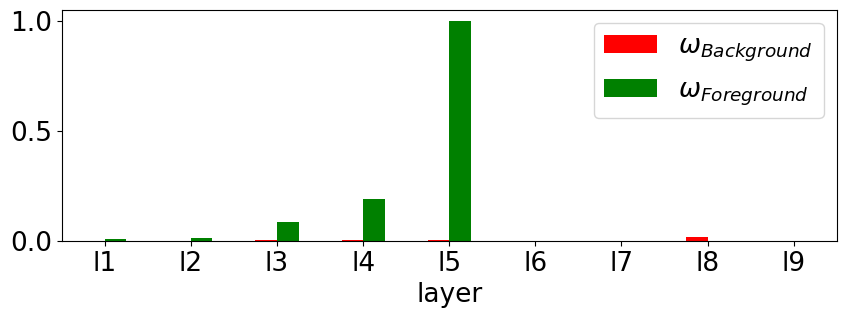

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


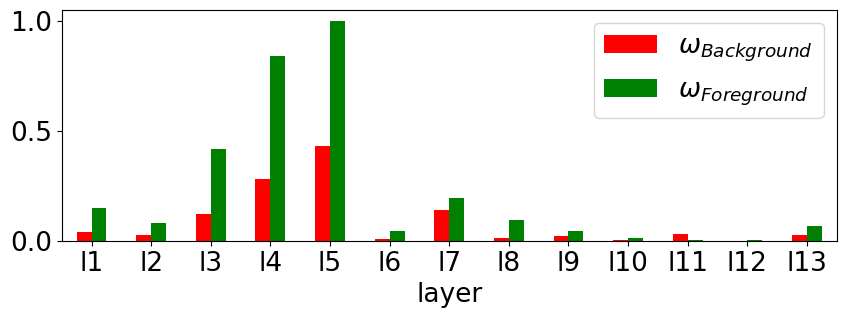

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


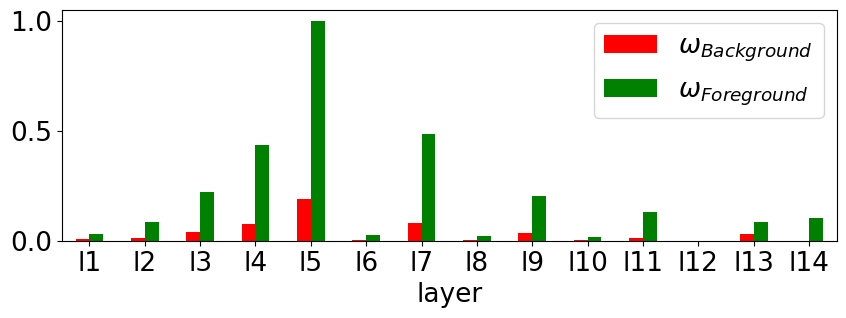

In [32]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

font = {'size'   : 19}
matplotlib.rc('font', **font)



dataset = 'infrared_thermal_feet_nodataaug' 
model ='f_r_s'
plot_weight(model,dataset,layers_fcn_rff)

model ='r_r_s'
dataset = 'infrared_thermal_feet_nodataaug' 
plot_weight(model,dataset,layers_res_rff)

model ='u_r_s'
dataset = 'infrared_thermal_feet' 
plot_weight(model,dataset,layers_unet_rff)

In [33]:
layers_fcn_rff = ['Conv11','Conv21','Conv31',
               'Conv41','Conv51','ConvRFF_02','Conv60','ConvRFF_01','Conv70']

layers_fcn = ['Conv11','Conv21','Conv31',
               'Conv41','Conv51',None,'Conv60',None,'Conv70']

layers_fcn_b_skips = ['Conv11','Conv21','Conv31',
               'Conv41','Conv51','Conv02','Conv60','Conv01','Conv70']


layers_unet = ['Conv11', 'Conv21', 'Conv31', 'Conv41', 'Conv51', None,
               'Conv61', None,'Conv71', None, 'Conv81',None,'Conv91', 'Conv100']

layers_unet_b_skips = ['Conv11', 'Conv21', 'Conv31', 'Conv41','Conv51',
                       'Conv04', 'Conv61', 'Conv03', 'Conv71', 'Conv02', 'Conv81',
                       'Conv01', 'Conv91', 'Conv100']

layers_unet_rff = ['Conv11', 'Conv21', 'Conv31','Conv41','Conv51', 'ConvRFF_04', 
                   'Conv61', 'ConvRFF_03', 'Conv71', 'ConvRFF_02', 'Conv81',
                   'ConvRFF_01', 'Conv91', 'Conv100']


layers_res = ['Res01_Conv02',
                'Res03_Conv02',
                'Res05_Conv02',
                'Res07_Conv02',
                'Res09_Conv02',
                None,
                'Res11_Conv02',
                None,
                'Res13_Conv02',
                None,
                'Res15_Conv02',
                None,
                'Res17_Conv02',
 ]

layers_res_b_skips = ['Res01_Conv02',
                'Res03_Conv02',
                'Res05_Conv02',
                'Res07_Conv02',
                'Res09_Conv02',
                'Conv04',
                'Res11_Conv02',
                'Conv03',
                'Res13_Conv02',
                'Conv02',
                'Res15_Conv02',
                'Conv01',
                'Res17_Conv02',
 ]

layers_res_rff = ['Res01_Conv02',
                'Res03_Conv02',
                'Res05_Conv02',
                'Res07_Conv02',
                'Res09_Conv02',
                'ConvRFF_04',
                'Res11_Conv02',
                'ConvRFF_03',
                'Res13_Conv02',
                'ConvRFF_02',
                'Res15_Conv02',
                'ConvRFF_01',
                'Res17_Conv02',
 ]

from convRFF.models import load_model
def load_model_from_run(run, model_name= 'model-best.h5'):
    path = run.file(model_name).download(replace=True).name
    model = load_model(path)
    return model


def plot_cams_all_layers(model,layers,dataset, axs, index_img=0):
    
    data = get_dataset(dataset)()[0]
    image, mask1, *_ = data.batch(1).skip(index_img).take(1).get_single_element()
    mask1 = mask1[...,0][...,None]
    #axs[0].set_title(model2name[model])
    axs[0].set_title(model2name[model], position=(0.6, 1))
    

    id_run = get_id(dataset, model)

    run = [run for run in runs if  run.id == id_run][0]
    model =  load_model_from_run(run)
    #
    image = tf.image.resize(image, model.layers[0].input_shape[0][1:-1])
    #mask = np.squeeze(mask)
    mask = model.predict(image) > 0.5
    mask = mask[...,0][...,None]
    mask = tf.cast(mask, tf.float32)
    mask = np.squeeze(mask)

    for a,b,c in ((mask1,'','white'),(mask,'','blue')):
        print(b,c)
        print('dasdasd')

    if dataset.startswith('infrared_thermal_feet'):
        dataset = 'infrared_thermal_feet'


    print(id_run)
    file_path= get_path(dataset, id_run)
    array_mmap = load_mimic_mmap(file_path, None)

    
    print(list(array_mmap._keys.keys()))
    if layers== None:
        layers = array_mmap._keys.keys()

    weights = get_weight(id_run, dataset, layers)
    fusion_img =0
    for i,l in enumerate(layers):
        if l== None:
            #axs[i].set_axis_off()
            axs[i].set_visible(False)
            continue

        
        print(l)
        if True:#i ==0:
            cam_layer = array_mmap[l]
            img = cam_layer['cam'][index_img,...]
            img = img[...,:2]
            img = img/(tf.reduce_max(img,axis=[0,1])+1e-16)

        if i ==0: 
            mask1 = tf.image.resize(mask1, img.shape[:-1])
            mask1 = np.squeeze(mask1)
        
        columns = ['w_0','w_1']
        
        if dataset == 'oxford_iiit_pet':
            img = img[...,::-1]
            columns = ['w_1','w_0']

        if True:#i ==0:            
            fusion_img += img*np.array(weights.loc[weights['layer']==l,columns])

            img = img/np.max(img)
            img = np.concatenate([img, np.zeros_like(img[...,0])[...,None]], axis=-1)

        bar_data = np.array(weights.loc[weights['layer']==l,columns])[0]
        plot_img_bar(img,((mask1,'','white'),(mask,'','blue')),bar_data,axs[i],l)

    fusion_img = np.concatenate([fusion_img, np.zeros_like(fusion_img[...,0])[...,None]], axis=-1)
    plot_contour(fusion_img/np.max(fusion_img), ((mask1,'','white'),(mask,'','blue')), ax=axs[-1])
    #axs[-1].get_legend().remove()
    axs[-1].set_ylabel('Fusion')
    axs[-1].set_xticks([])
    axs[-1].set_yticks([])


In [35]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25


1/1 [==============================] - 1s 565ms/step
 white
dasdasd
 blue
dasdasd
qav9pmnj
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'Conv60', 'Conv70', 'Pool30', 'Pool40']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
Conv60
Conv70
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 646ms/step
 white
dasdasd
 blue
dasdasd
m2pciil0
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'ConvRFF_02', 'Conv60', 'ConvRFF_01', 'Conv70', 'Pool30', 'Pool40']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
ConvRFF_02
Conv60
ConvRFF_01
Conv70
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 951ms/step
 white
dasdasd
 blue
dasdasd
xrrrkopi
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'ConvRFF_02', 'Conv60', 'ConvRFF_01', 'Conv70', 'Pool30', 'Pool40']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
ConvRFF_02
Conv60
ConvRFF_01
Conv70
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 505ms/step
 white
dasdasd
 blue
dasdasd
qpc82n9c
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'Conv02', 'Conv60', 'Conv01', 'Conv70', 'Pool30', 'Pool40']
Conv11
Conv21


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv31
Conv41
Conv51
Conv02
Conv60
Conv01
Conv70
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 0s 334ms/step
 white
dasdasd
 blue
dasdasd
mun3lx10
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'Conv02', 'Conv60', 'Conv01', 'Conv70', 'Pool30', 'Pool40']
Conv11
Conv21

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()



Conv31
Conv41
Conv51
Conv02
Conv60
Conv01
Conv70


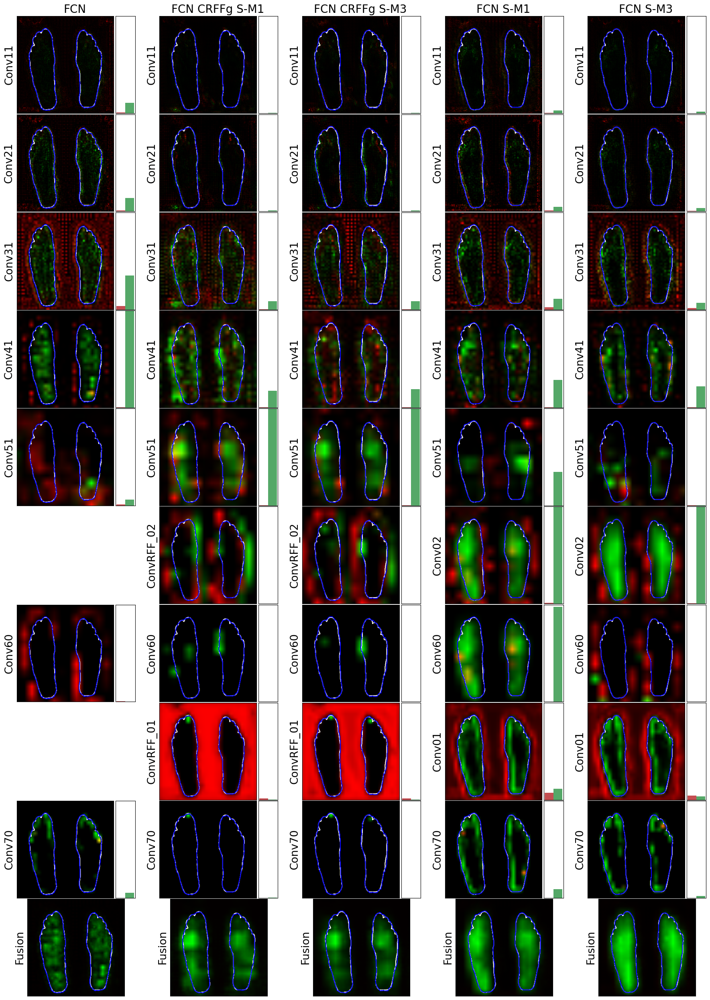

In [36]:
params = {'axes.labelsize': 19,
          'axes.titlesize': 20}#resunet


matplotlib.rcParams.update(params)

dataset = 'infrared_thermal_feet_nodataaug'

index_img = 0
fig, axs = plt.subplots(nrows=len(layers_fcn_rff)+1, ncols=5,figsize=(20,25))
plot_cams_all_layers('f_b',layers_fcn,dataset, axs[:,0].flat, index_img=index_img)
plot_cams_all_layers('f_r_s_m1',layers_fcn_rff,dataset, axs[:,1].flat, index_img=index_img)
plot_cams_all_layers('f_r_s',layers_fcn_rff,dataset, axs[:,2].flat, index_img=index_img)
plot_cams_all_layers('f_b_s',layers_fcn_b_skips,dataset, axs[:,3].flat, index_img=index_img)
plot_cams_all_layers('f_b_s_m3',layers_fcn_b_skips,dataset, axs[:,4].flat, index_img=index_img)


plt.tight_layout()
plt.subplots_adjust(
                    wspace=-0.35,hspace=0.01 #FCN
                    )

plt.savefig(f'cams_unet1.pdf',bbox_inches='tight', pad_inches=0)
plt.show()

 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 846ms/step
 white
dasdasd
 blue
dasdasd
cbqmtis0
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'Conv60', 'Conv61', 'Conv70', 'Conv71', 'Conv80', 'Conv81', 'Conv90', 'Conv91', 'Conv100']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
Conv61
Conv71
Conv81
Conv91
Conv100
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 969ms/step
 white
dasdasd
 blue
dasdasd
xqfrem5b
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'ConvRFF_04', 'Conv60', 'Conv61', 'ConvRFF_03', 'Conv70', 'Conv71', 'ConvRFF_02', 'Conv80', 'Conv81', 'ConvRFF_01', 'Conv90', 'Conv91', 'Conv100']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
ConvRFF_04
Conv61
ConvRFF_03
Conv71
ConvRFF_02
Conv81
ConvRFF_01
Conv91
Conv100
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 1s/step
 white
dasdasd
 blue
dasdasd
w2tlsz06
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'ConvRFF_04', 'Conv60', 'Conv61', 'ConvRFF_03', 'Conv70', 'Conv71', 'ConvRFF_02', 'Conv80', 'Conv81', 'ConvRFF_01', 'Conv90', 'Conv91', 'Conv100']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
ConvRFF_04
Conv61
ConvRFF_03
Conv71
ConvRFF_02
Conv81
ConvRFF_01
Conv91
Conv100
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 524ms/step
 white
dasdasd
 blue
dasdasd
hz0pen55
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'Conv04', 'Conv60', 'Conv61', 'Conv03', 'Conv70', 'Conv71', 'Conv02', 'Conv80', 'Conv81', 'Conv01', 'Conv90', 'Conv91', 'Conv100']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
Conv04
Conv61
Conv03
Conv71
Conv02
Conv81
Conv01
Conv91
Conv100
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 626ms/step
 white
dasdasd
 blue
dasdasd
cgkgib7m
['Conv10', 'Conv11', 'Conv20', 'Conv21', 'Conv30', 'Conv31', 'Conv40', 'Conv41', 'Conv50', 'Conv51', 'Conv04', 'Conv60', 'Conv61', 'Conv03', 'Conv70', 'Conv71', 'Conv02', 'Conv80', 'Conv81', 'Conv01', 'Conv90', 'Conv91', 'Conv100']
Conv11


<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Conv21
Conv31
Conv41
Conv51
Conv04
Conv61
Conv03
Conv71
Conv02
Conv81
Conv01
Conv91
Conv100


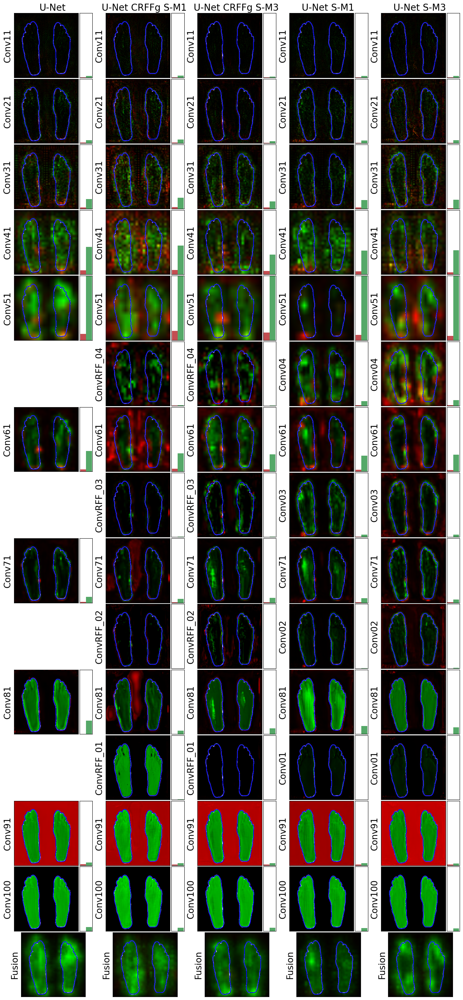

In [40]:
index_img = 0
fig, axs = plt.subplots(nrows=len(layers_unet_rff)+1, ncols=5,figsize=(25,30))
plot_cams_all_layers('u_b',layers_unet,dataset, axs[:,0].flat, index_img=index_img)
plot_cams_all_layers('u_r_s_m1',layers_unet_rff,dataset, axs[:,1].flat, index_img=index_img)
plot_cams_all_layers('u_r_s',layers_unet_rff,dataset, axs[:,2].flat, index_img=index_img)
plot_cams_all_layers('u_b_s',layers_unet_b_skips,dataset, axs[:,3].flat, index_img=index_img)
plot_cams_all_layers('u_b_s_m3',layers_unet_b_skips,dataset, axs[:,4].flat, index_img=index_img)


plt.tight_layout()
plt.subplots_adjust(

                    wspace=-0.80,hspace=0.02 
                    
                    )

plt.savefig(f'cams_unet1.pdf',bbox_inches='tight', pad_inches=0)
plt.show()

 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 2s 2s/step
 white
dasdasd
 blue
dasdasd
04ilqh7l
['Res00_Conv00', 'Res00_Conv01', 'Res00_Conv02', 'Res01_Conv00', 'Res01_Conv01', 'Res01_Conv02', 'Res02_Conv00', 'Res02_Conv01', 'Res02_Conv02', 'Res03_Conv00', 'Res03_Conv01', 'Res03_Conv02', 'Res04_Conv00', 'Res04_Conv01', 'Res04_Conv02', 'Res05_Conv00', 'Res05_Conv01', 'Res05_Conv02', 'Res06_Conv00', 'Res06_Conv01', 'Res06_Conv02', 'Res07_Conv00', 'Res07_Conv01', 'Res07_Conv02', 'Res08_Conv00', 'Res08_Conv01', 'Res08_Conv02', 'Res09_Conv00', 'Res09_Conv01', 'Res09_Conv02', 'Res10_Conv00', 'Res10_Conv01', 'Res10_Conv02', 'Res11_Conv00', 'Res11_Conv01', 'Res11_Conv02', 'Res12_Conv00', 'Res12_Conv01', 'Res12_Conv02', 'Res13_Conv00', 'Res13_Conv01', 'Res13_Conv02', 'Res14_Conv00', 'Res14_Conv01', 'Res14_Conv02', 'Res15_Conv00', 'Res15_Conv01', 'Res15_Conv02', 'Res16_Conv00', 'Res16_Conv01

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Res03_Conv02
Res05_Conv02
Res07_Conv02
Res09_Conv02
Res11_Conv02
Res13_Conv02
Res15_Conv02
Res17_Conv02
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 2s 2s/step
 white
dasdasd
 blue
dasdasd
xo54wof3
['Res00_Conv00', 'Res00_Conv01', 'Res00_Conv02', 'Res01_Conv00', 'Res01_Conv01', 'Res01_Conv02', 'Res02_Conv00', 'Res02_Conv01', 'Res02_Conv02', 'Res03_Conv00', 'Res03_Conv01', 'Res03_Conv02', 'Res04_Conv00', 'Res04_Conv01', 'Res04_Conv02', 'Res05_Conv00', 'Res05_Conv01', 'Res05_Conv02', 'Res06_Conv00', 'Res06_Conv01', 'Res06_Conv02', 'Res07_Conv00', 'Res07_Conv01', 'Res07_Conv02', 'Res08_Conv00', 'Res08_Conv01', 'Res08_Conv02', 'Res09_Conv00', 'Res09_Conv01', 'Res09_Conv02', 'ConvRFF_04', 'Res10_Conv00', 'Res10_Conv01', 'Res10_Conv02', 'Res11_Conv00', 'Res11_Conv01', 'Res11_Conv02', 'ConvRFF_03', 'Res12_Conv00', 'Res12_Conv01', 'Res12_Conv02', 'Res13_Conv00', 'Res13_Conv01', 'Res13_Co

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Res03_Conv02
Res05_Conv02
Res07_Conv02
Res09_Conv02
ConvRFF_04
Res11_Conv02
ConvRFF_03
Res13_Conv02
ConvRFF_02
Res15_Conv02
ConvRFF_01
Res17_Conv02
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 3s 3s/step
 white
dasdasd
 blue
dasdasd
atgged0u
['Res00_Conv00', 'Res00_Conv01', 'Res00_Conv02', 'Res01_Conv00', 'Res01_Conv01', 'Res01_Conv02', 'Res02_Conv00', 'Res02_Conv01', 'Res02_Conv02', 'Res03_Conv00', 'Res03_Conv01', 'Res03_Conv02', 'Res04_Conv00', 'Res04_Conv01', 'Res04_Conv02', 'Res05_Conv00', 'Res05_Conv01', 'Res05_Conv02', 'Res06_Conv00', 'Res06_Conv01', 'Res06_Conv02', 'Res07_Conv00', 'Res07_Conv01', 'Res07_Conv02', 'Res08_Conv00', 'Res08_Conv01', 'Res08_Conv02', 'Res09_Conv00', 'Res09_Conv01', 'Res09_Conv02', 'ConvRFF_04', 'Res10_Conv00', 'Res10_Conv01', 'Res10_Conv02', 'Res11_Conv00', 'Res11_Conv01', 'Res11_Conv02', 'ConvRFF_03', 'Res12_Conv00', 'Res12_Conv01', 'Res12_Conv02

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Res03_Conv02
Res05_Conv02
Res07_Conv02
Res09_Conv02
ConvRFF_04
Res11_Conv02
ConvRFF_03
Res13_Conv02
ConvRFF_02
Res15_Conv02
ConvRFF_01
Res17_Conv02
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 1s/step
 white
dasdasd
 blue
dasdasd
tjyzriob
['Res00_Conv00', 'Res00_Conv01', 'Res00_Conv02', 'Res01_Conv00', 'Res01_Conv01', 'Res01_Conv02', 'Res02_Conv00', 'Res02_Conv01', 'Res02_Conv02', 'Res03_Conv00', 'Res03_Conv01', 'Res03_Conv02', 'Res04_Conv00', 'Res04_Conv01', 'Res04_Conv02', 'Res05_Conv00', 'Res05_Conv01', 'Res05_Conv02', 'Res06_Conv00', 'Res06_Conv01', 'Res06_Conv02', 'Res07_Conv00', 'Res07_Conv01', 'Res07_Conv02', 'Res08_Conv00', 'Res08_Conv01', 'Res08_Conv02', 'Res09_Conv00', 'Res09_Conv01', 'Res09_Conv02', 'Conv04', 'Res10_Conv00', 'Res10_Conv01', 'Res10_Conv02', 'Res11_Conv00', 'Res11_Conv01', 'Res11_Conv02', 'Conv03', 'Res12_Conv00', 'Res12_Conv01', 'Res12_Conv02', 'Res1

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Res03_Conv02
Res05_Conv02
Res07_Conv02
Res09_Conv02
Conv04
Res11_Conv02
Conv03
Res13_Conv02
Conv02
Res15_Conv02
Conv01
Res17_Conv02
 Number of images for Partition 1: 134
 Number of images for Partition 2: 7
 Number of images for Partition 3: 25
1/1 [==============================] - 1s 1s/step
 white
dasdasd
 blue
dasdasd
tso13pts
['Res00_Conv00', 'Res00_Conv01', 'Res00_Conv02', 'Res01_Conv00', 'Res01_Conv01', 'Res01_Conv02', 'Res02_Conv00', 'Res02_Conv01', 'Res02_Conv02', 'Res03_Conv00', 'Res03_Conv01', 'Res03_Conv02', 'Res04_Conv00', 'Res04_Conv01', 'Res04_Conv02', 'Res05_Conv00', 'Res05_Conv01', 'Res05_Conv02', 'Res06_Conv00', 'Res06_Conv01', 'Res06_Conv02', 'Res07_Conv00', 'Res07_Conv01', 'Res07_Conv02', 'Res08_Conv00', 'Res08_Conv01', 'Res08_Conv02', 'Res09_Conv00', 'Res09_Conv01', 'Res09_Conv02', 'Conv04', 'Res10_Conv00', 'Res10_Conv01', 'Res10_Conv02', 'Res11_Conv00', 'Res11_Conv01', 'Res11_Conv02', 'Conv03', 'Res12_Conv00', 'Res12_Conv01', 'Res12_Conv02', 'Res13_Conv00', 'Res1

<ipython-input-29-b5cd7640f1eb>:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_ = df.groupby(by=['model','layer']).mean().reset_index()


Res03_Conv02
Res05_Conv02
Res07_Conv02
Res09_Conv02
Conv04
Res11_Conv02
Conv03
Res13_Conv02
Conv02
Res15_Conv02
Conv01
Res17_Conv02


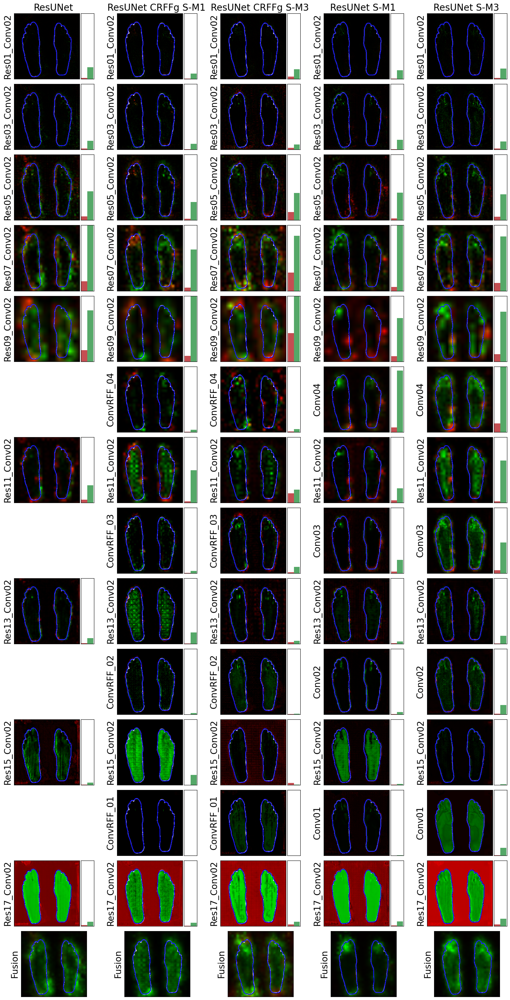

In [39]:
index_img = 0
fig, axs = plt.subplots(nrows=len(layers_res_rff)+1, ncols=5,figsize=(25,30))
plot_cams_all_layers('r_b',layers_res,dataset, axs[:,0].flat, index_img=index_img)
plot_cams_all_layers('r_r_s_m1',layers_res_rff,dataset, axs[:,1].flat, index_img=index_img)
plot_cams_all_layers('r_r_s',layers_res_rff,dataset, axs[:,2].flat, index_img=index_img)
plot_cams_all_layers('r_b_s',layers_res_b_skips,dataset, axs[:,3].flat, index_img=index_img)
plot_cams_all_layers('r_b_s_m3',layers_res_b_skips,dataset, axs[:,4].flat, index_img=index_img)

plt.tight_layout()
plt.subplots_adjust(

                    wspace=-0.75, #resunet

                    
                    )

plt.savefig(f'cams_unet1.pdf',bbox_inches='tight', pad_inches=0)
plt.show()